<a href="https://colab.research.google.com/github/GreyPaldin/CV_LB4/blob/main/LB4_vizhen.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**УСТНОВКА ОСНОВНОЙ БИБЛИОТЕКИ ДЛЯ РАБОТЫ**

In [ ]:
# 7. Установка ultralytics (если еще не установлена)
!pip install ultralytics

In [ ]:
#@title Загрузка датасета с аниме лицами
from PIL import Image
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import os
from google.colab import drive
import yaml
from ultralytics import YOLO

# 1. Подключение Google Drive
drive.mount('/content/drive')

# 2. Определение пути к архиву
archive_path = '/content/drive/MyDrive/data_set_face/face.zip'  # **Укажите свой путь к архиву!**

# 3. Путь к папке, куда будут распакованы данные
extracted_path = '/content/data'

# 4. Распаковка архива
import zipfile
with zipfile.ZipFile(archive_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_path)


In [ ]:
#@title Обучение модели для распознания аниме лиц (вариант модели v1)
# 5. Определение путей к данным
train_dir = os.path.join(extracted_path, 'train')
val_dir = os.path.join(extracted_path, 'valid')
test_dir = os.path.join(extracted_path, 'test')

# 6. Создание `data.yaml` файла
data = {
    'train': os.path.join(train_dir, 'images'),  # Путь к тренировочным изображениям
    'val':   os.path.join(val_dir, 'images'),    # Путь к валидационным изображениям
    'test':  os.path.join(test_dir, 'images'),   # Путь к тестовым изображениям (если есть)
    'nc': 1,       # Количество классов (у вас 1 класс - лицо)
    'names': ['face'] # Названия классов
}

with open('/content/data.yaml', 'w') as f:
    yaml.dump(data, f)

# 8. Обучение модели YOLOv8
# Загрузка предобученной модели (например, YOLOv8n.pt - самая маленькая и быстрая)
model = YOLO('yolov8n.pt')  # или yolov8s.pt, yolov8m.pt, yolov8l.pt, yolov8x.pt - больше модель, точнее результат, дольше обучение

# Обучение модели
results = model.train(data='/content/data.yaml', epochs=10, imgsz=640)  # epochs - количество эпох обучения, imgsz - размер изображений

# 9. Валидация модели
metrics = model.val(data='/content/data.yaml')



Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, 

100%|██████████| 755k/755k [00:00<00:00, 20.0MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 83.3MB/s]


AMP: checks passed ✅


train: Scanning /content/data/train/labels... 5293 images, 385 backgrounds, 0 corrupt: 100%|██████████| 5293/5293 [00:02<00:00, 2059.53it/s]


train: New cache created: /content/data/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/data/valid/labels... 662 images, 51 backgrounds, 0 corrupt: 100%|██████████| 662/662 [00:00<00:00, 1120.73it/s]


val: New cache created: /content/data/valid/labels.cache
Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.22G      1.316      1.979      1.517         17        640: 100%|██████████| 331/331 [02:05<00:00,  2.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:10<00:00,  1.96it/s]


                   all        662        746      0.953      0.837      0.916      0.613

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.84G      1.129     0.9001      1.329         13        640: 100%|██████████| 331/331 [02:09<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:09<00:00,  2.15it/s]

                   all        662        746      0.947      0.831      0.905      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.85G      1.096     0.7353      1.305         21        640: 100%|██████████| 331/331 [02:01<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:09<00:00,  2.25it/s]

                   all        662        746      0.921      0.863      0.917      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.87G      1.041     0.6626      1.261         17        640: 100%|██████████| 331/331 [02:00<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:08<00:00,  2.37it/s]

                   all        662        746      0.983      0.894      0.947      0.674



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.89G      1.004     0.6006      1.239         17        640: 100%|██████████| 331/331 [02:01<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:08<00:00,  2.42it/s]

                   all        662        746      0.964      0.893       0.95      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10       2.9G     0.9726     0.5552      1.214         13        640: 100%|██████████| 331/331 [02:08<00:00,  2.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:07<00:00,  2.70it/s]

                   all        662        746      0.976      0.912       0.96      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10       3.1G     0.9533     0.5217      1.197         15        640: 100%|██████████| 331/331 [02:13<00:00,  2.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:08<00:00,  2.47it/s]

                   all        662        746      0.972      0.918      0.963      0.711



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      3.12G      0.932     0.4909      1.185         16        640: 100%|██████████| 331/331 [02:10<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:11<00:00,  1.82it/s]

                   all        662        746      0.983       0.94       0.97      0.716



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      3.14G     0.9024     0.4582      1.169         12        640: 100%|██████████| 331/331 [02:18<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:09<00:00,  2.17it/s]

                   all        662        746      0.979      0.937      0.975      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      3.16G     0.8795     0.4352      1.146         16        640: 100%|██████████| 331/331 [02:16<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:09<00:00,  2.21it/s]

                   all        662        746      0.972      0.946      0.976       0.74



10 epochs completed in 0.386 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.2MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:12<00:00,  1.73it/s]


                   all        662        746      0.974      0.946      0.976      0.739
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs/detect/train2
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/data/valid/labels.cache... 662 images, 51 backgrounds, 0 corrupt: 100%|██████████| 662/662 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 42/42 [00:14<00:00,  2.86it/s]


                   all        662        746      0.974      0.944      0.976       0.74
Speed: 0.6ms preprocess, 7.3ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs/detect/train22

image 1/663 /content/data/test/images/000004_jpg.rf.ee00728de0b1ff6715a8deb084365573.jpg: 640x480 1 face, 37.4ms
image 2/663 /content/data/test/images/000013_jpg.rf.e97b6e0d58fde8b6d516a12869a9a066.jpg: 480x640 1 face, 34.7ms
image 3/663 /content/data/test/images/000054_jpg.rf.ba6c11dfeb91ec68ec5b143a8ca9e010.jpg: 640x480 1 face, 6.8ms
image 4/663 /content/data/test/images/000056_jpg.rf.b9a9225196f35a0063665a6b5cb2197c.jpg: 640x480 1 face, 6.3ms
image 5/663 /content/data/test/images/000063_jpg.rf.199610e8685d1e10bdece1208a907250.jpg: 480x640 1 face, 12.3ms
image 6/663 /content/data/test/images/000081_jpg.rf.d7fd70fe16000a5354b50f16104d5961.jpg: 640x576 1 face, 35.7ms
image 7/663 /content/data/test/images/000104_jpg.rf.ff720e8425d6f2f4d5ad34e7c4270e2f.jpg: 640x480 3 faces, 6.9ms
im

NameError: name 'Image' is not defined


image 1/1 /content/drive/MyDrive/data_set_face/Aska_test.jpg: 512x640 1 face, 8.7ms
Speed: 3.5ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 640)
Обнаружено лицо с вероятностью: 0.831


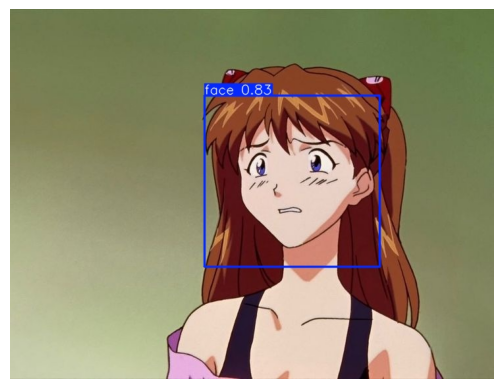


image 1/1 /content/drive/MyDrive/data_set_face/Car_test.jpg: 256x640 1 face, 22.5ms
Speed: 5.3ms preprocess, 22.5ms inference, 1.4ms postprocess per image at shape (1, 3, 256, 640)
Обнаружено лицо с вероятностью: 0.879


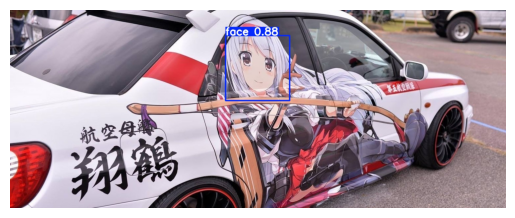

In [ ]:
#@title Тест модели (вариант модели v1)
test_image_path = '/content/drive/MyDrive/data_set_face/Aska_test.jpg'
results = model.predict(test_image_path)
for result in results:
    boxes = result.boxes  # Boxes object for bounding boxes
    probs = result.probs # Class probabilities for classification models

    for box in boxes:
      xyxy = box.xyxy[0].tolist()
      conf = box.conf[0].item()
      cls = box.cls[0].item()

      print(f"Обнаружено лицо с вероятностью: {conf:.3f}")

      label = f'{model.names[int(cls)]} {conf:.2f}'
      plot_result = result.plot()
      cv2.imwrite("result.jpg", plot_result)

      #OpenCV doesn't show the image properly
      img = Image.open("result.jpg")
      plt.imshow(img)
      plt.axis('off')  # Turn off axis labels
      plt.show()

test_image_path = '/content/drive/MyDrive/data_set_face/Car_test.jpg'
results = model.predict(test_image_path)
for result in results:
    boxes = result.boxes  # Boxes object for bounding boxes
    probs = result.probs # Class probabilities for classification models

    for box in boxes:
      xyxy = box.xyxy[0].tolist()
      conf = box.conf[0].item()
      cls = box.cls[0].item()

      print(f"Обнаружено лицо с вероятностью: {conf:.3f}")

      label = f'{model.names[int(cls)]} {conf:.2f}'
      plot_result = result.plot()
      cv2.imwrite("result.jpg", plot_result)

      #OpenCV doesn't show the image properly
      img = Image.open("result.jpg")
      plt.imshow(img)
      plt.axis('off')  # Turn off axis labels
      plt.show()

In [ ]:
#@title Тест модели на всей тестовой выборке (вариант модели v1)

for result in results:
    boxes = result.boxes  # Boxes object for bounding boxes
    probs = result.probs # Class probabilities for classification models

    for box in boxes:
      xyxy = box.xyxy[0].tolist()
      conf = box.conf[0].item()
      cls = box.cls[0].item()

      print(f"Обнаружено лицо с вероятностью: {conf:.3f}")

      label = f'{model.names[int(cls)]} {conf:.2f}'
      plot_result = result.plot()
      cv2.imwrite("result.jpg", plot_result)

      #OpenCV doesn't show the image properly
      img = Image.open("result.jpg")
      plt.imshow(img)
      plt.axis('off')  # Turn off axis labels
      plt.show()

ДАЛЕЕ ИДЁТ ОБУЧЕНИЕ И ТЕСТЫ МОДЕЛИ ДЛЯ ДВУХ КЛАССОВ

In [ ]:
!pip install ultralytics

In [32]:
#@title Обучение модели для двух классов (версия модели v2)
import zipfile
import os
import shutil
import random
from google.colab import drive
import yaml
from PIL import Image, ImageDraw
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt
import pandas as pd # Import pandas

# 3. Улучшенная функция распаковки
def extract_archive(archive_path, extracted_path, dataset_name):
    """Распаковывает архив и возвращает пути к данным с проверкой содержимого"""
    dataset_path = os.path.join(extracted_path, dataset_name)

    # Проверяем существование архива
    if not os.path.exists(archive_path):
        raise FileNotFoundError(f"Архив {archive_path} не найден!")

    # Создаем папку для распаковки
    os.makedirs(dataset_path, exist_ok=True)

    print(f"\nРаспаковываем {dataset_name} из {archive_path}...")

    # Проверяем содержимое архива перед распаковкой
    with zipfile.ZipFile(archive_path, 'r') as zip_ref:
        file_list = zip_ref.namelist()
        print(f"Найдено {len(file_list)} файлов в архиве")

        if not file_list:
            print("Архив пустой!")
            return None, None

        # Распаковываем
        zip_ref.extractall(dataset_path)
        print(f"Успешно распаковано в {dataset_path}")

    # Ищем папки с изображениями и метками
    images_path = None
    labels_path = None

    for root, dirs, files in os.walk(dataset_path):
        if 'images' in dirs:
            images_path = os.path.join(root, 'images')
        if 'labels' in dirs:
            labels_path = os.path.join(root, 'labels')

    if not images_path or not labels_path:
        print("Предупреждение: не найдены папки images/ или labels/ в распакованных данных")
        print("Содержимое архива:")
        print(os.listdir(dataset_path))

    return images_path, labels_path

# 4. Распаковка архивов с проверкой
print("="*50)
print("Обработка архива с аниме-лицами")
anime_faces_images, anime_faces_labels = extract_archive(anime_faces_archive, extracted_path, 'anime_faces')

print("\n" + "="*50)
print("Обработка архива с машинами")
cars_images, cars_labels = extract_archive(cars_archive, extracted_path, 'cars')

# 5. Проверка результатов
def check_directory_contents(path, description):
    if path and os.path.exists(path):
        files = os.listdir(path)
        print(f"\n{description}:")
        print(f"Путь: {path}")
        print(f"Найдено файлов: {len(files)}")
        if files:
            print("Примеры файлов:", files[:3])
    else:
        print(f"\n{description}: папка не существует или пуста")

check_directory_contents(anime_faces_images, "Аниме-лица (изображения)")
check_directory_contents(anime_faces_labels, "Аниме-лица (метки)")
check_directory_contents(cars_images, "Машины (изображения)")
check_directory_contents(cars_labels, "Машины (метки)")

# 5. Создание объединенного датасета
combined_train_dir = os.path.join(extracted_path, 'combined', 'train', 'images')
combined_val_dir = os.path.join(extracted_path, 'combined', 'valid', 'images')

combined_train_labels_dir = os.path.join(extracted_path, 'combined', 'train', 'labels')
combined_val_labels_dir = os.path.join(extracted_path, 'combined', 'valid', 'labels')

#Убедимся, что они есть
os.makedirs(combined_train_dir, exist_ok = True)
os.makedirs(combined_val_dir, exist_ok = True)
os.makedirs(combined_train_labels_dir, exist_ok = True)
os.makedirs(combined_val_labels_dir, exist_ok = True)

print("Создаем объединенный датасет...")

# Функция для копирования и изменения меток
def combine_datasets(source_images_dir, source_labels_dir, dest_images_dir, dest_labels_dir, class_id_offset):
    """Копирует изображения и изменяет ID классов в файлах меток."""
    #Создаем labels если их нет
    os.makedirs(dest_labels_dir, exist_ok = True)
    image_files = [f for f in os.listdir(source_images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
    for image_file in image_files:
        image_path = os.path.join(source_images_dir, image_file)
        shutil.copy(image_path, os.path.join(dest_images_dir, image_file))

        #Копируем метки
        label_file_name = os.path.splitext(image_file)[0] + '.txt'
        source_label_path = os.path.join(source_labels_dir, label_file_name)
        #Проверим, что файл существует, прежде чем копировать
        if os.path.isfile(source_label_path):
          dest_label_path = os.path.join(dest_labels_dir, label_file_name)
          try:
              with open(source_label_path, 'r') as infile, open(dest_label_path, 'w') as outfile:
                  for line in infile:
                      class_id, *coords = line.split()
                      new_class_id = int(class_id) + class_id_offset
                      outfile.write(f"{new_class_id} {' '.join(coords)}\n")
          except Exception as e:
              print(f"Ошибка обработки файла меток {label_file_name}: {e}")
        else:
          print(f"Предупреждение: файл меток {label_file_name} не найден.")

# Поиск папок с изображениями и labels
def find_labels_dir(dataset_path):
  labels_path = os.path.join(dataset_path, 'labels')
  return labels_path

# Combine datasets
anime_faces_labels = find_labels_dir(os.path.dirname(anime_faces_train)) #Учитываем, что anime_faces_train возвращает ../images
cars_labels = find_labels_dir(os.path.dirname(cars_train)) #Учитываем, что cars_train возвращает ../images

combine_datasets(anime_faces_train, anime_faces_labels, combined_train_dir, combined_train_labels_dir, 0)  # Anime faces - class 0
combine_datasets(cars_train, cars_labels, combined_train_dir, combined_train_labels_dir, 1)  # Cars - class 1

combine_datasets(anime_faces_val, find_labels_dir(os.path.dirname(anime_faces_val)), combined_val_dir, combined_val_labels_dir, 0)
combine_datasets(cars_val, find_labels_dir(os.path.dirname(cars_val)), combined_val_dir, combined_val_labels_dir, 1)

print("Объединенный датасет создан.")

# 6. Создание `data.yaml` файла
data = {
    'train': combined_train_dir,       # Путь к тренировочным изображениям
    'val':   combined_val_dir,         # Путь к валидационным изображениям
    'nc': 2,                           # Количество классов (лицо и машина)
    'names': ['face', 'car']          # Названия классов
}

with open('/content/data.yaml', 'w') as f:
    yaml.dump(data, f)



Обработка архива с аниме-лицами

Распаковываем anime_faces из /content/drive/MyDrive/data_set_face/face.zip...
Найдено 13238 файлов в архиве
Успешно распаковано в /content/data/anime_faces

Обработка архива с машинами

Распаковываем cars из /content/drive/MyDrive/data_set_face/car.zip...
Найдено 32355 файлов в архиве
Успешно распаковано в /content/data/cars

Аниме-лица (изображения):
Путь: /content/data/anime_faces/test/images
Найдено файлов: 663
Примеры файлов: ['002269_jpg.rf.93c48b1983f726cdf3296e3a6239b5d9.jpg', '006092_jpg.rf.834c1cfd06fe6c0733af2c6d25dafe9d.jpg', '006147_jpg.rf.6ed802b931d5808c9afc93e0b0921e71.jpg']

Аниме-лица (метки):
Путь: /content/data/anime_faces/test/labels
Найдено файлов: 663
Примеры файлов: ['002601_jpg.rf.28a4057e2adebf4388d1f9504c3518fd.txt', '006154_jpg.rf.a75effa63de086095e8cd85a7479e76f.txt', '004854_jpg.rf.ea7b9e32ff18dadf3d79f8add438c019.txt']

Машины (изображения):
Путь: /content/data/cars/test/images
Найдено файлов: 1594
Примеры файлов: ['003338.

In [ ]:
#Запуск обучения
print("Обучаем модель YOLOv8...")
model = YOLO('yolov8n.pt')  # Загрузка предобученной модели

results = model.train(data='/content/data.yaml', epochs=10, imgsz=640,
                      save_period=5, # Сохраняем веса каждой n эпохи
                      device=0 #Используем GPU, если доступен
                      )
print("Обучение завершено.")

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/data/combined/valid/labels.cache... 2280 images, 51 backgrounds, 0 corrupt: 100%|██████████| 2280/2280 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 143/143 [00:33<00:00,  4.27it/s]


                   all       2280       2364      0.991      0.963      0.984      0.843
                  face        611        746      0.983      0.928      0.973      0.736
                   car       1618       1618      0.999      0.998      0.995       0.95
Speed: 0.3ms preprocess, 3.4ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/detect/train33


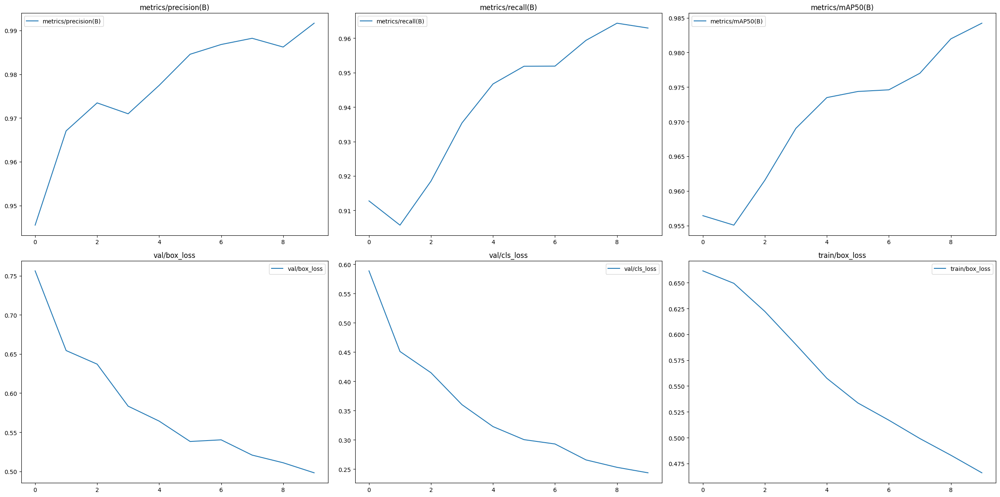

In [ ]:
#@title Вывод метрик для модели с двумя классами (модель версия v2)

metrics = model.val(data='/content/data.yaml')

# Определяем директорию сохранения результатов (предполагая, что это последний запуск)
save_dir = 'runs/detect/train3'  # Замените на фактическую директорию, если она отличается

# Чтение файла results.csv
results_csv_path = os.path.join(save_dir, "results.csv")
results = pd.read_csv(results_csv_path)

#Выведем графики
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(24, 12))

# Plot mapping
plot_mapping = {
    (0, 0): "metrics/precision(B)",
    (0, 1): "metrics/recall(B)",
    (0, 2): "metrics/mAP50(B)",
    (1, 0): "val/box_loss",
    (1, 1): "val/cls_loss",
    (1, 2): "train/box_loss"
}

for ax_coords, column in plot_mapping.items():
    ax = axes[ax_coords]
    ax.plot(results[column], label=column)
    ax.set_title(column)
    ax.legend()

plt.tight_layout()
plt.show()

--2025-03-23 17:30:56--  https://github.com/HackFonts/TimesNewRoman/raw/master/Times%20New%20Roman.ttf
Resolving github.com (github.com)... 140.82.116.4
Connecting to github.com (github.com)|140.82.116.4|:443... connected.
HTTP request sent, awaiting response... 404 Not Found
2025-03-23 17:30:56 ERROR 404: Not Found.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).

image 1/1 /content/drive/MyDrive/data_set_face/test/Aska_test.jpg: 512x640 1 face, 53.9ms
Speed: 19.7ms preprocess, 53.9ms inference, 8.9ms postprocess per image at shape (1, 3, 512, 640)

Обработка изображения: Aska_test.jpg
Ошибка загрузки шрифта: unknown file format
Обнаружен объект: face, уверенность: 0.86, координаты: [302.77313232421875, 130.84474182128906, 559.064208984375, 390.546142578125]


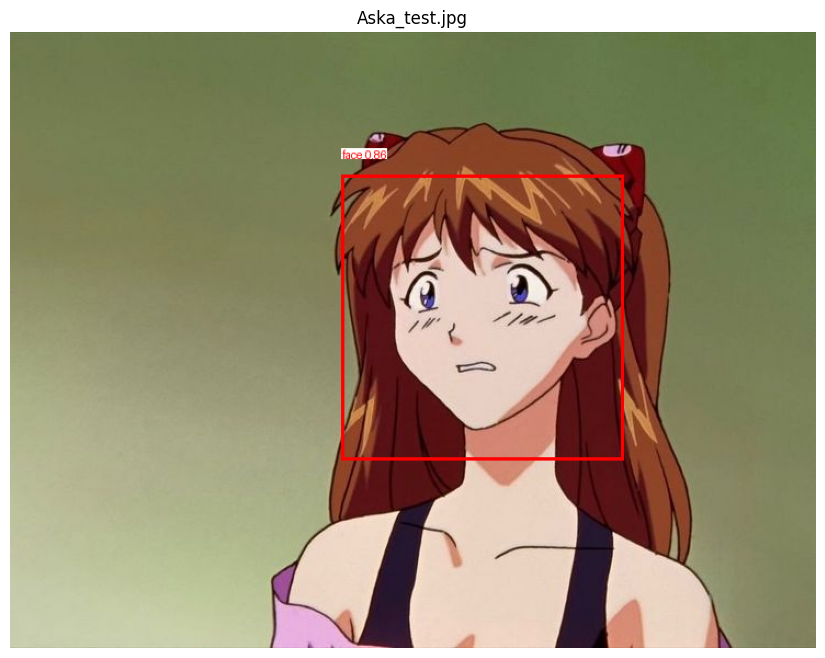


image 1/1 /content/drive/MyDrive/data_set_face/test/Car_test.jpg: 256x640 1 face, 16.1ms
Speed: 6.5ms preprocess, 16.1ms inference, 1.6ms postprocess per image at shape (1, 3, 256, 640)

Обработка изображения: Car_test.jpg
Ошибка загрузки шрифта: unknown file format
Обнаружен объект: face, уверенность: 0.85, координаты: [837.66064453125, 112.38642883300781, 1072.681640625, 349.3402404785156]


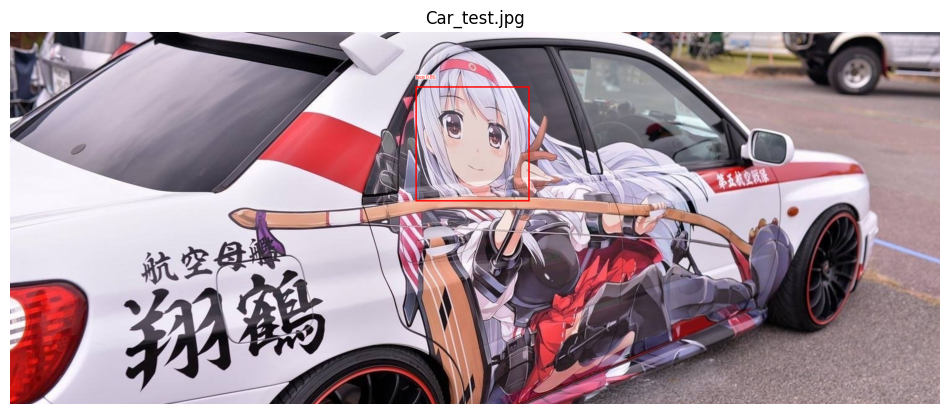


image 1/1 /content/drive/MyDrive/data_set_face/test/Anime_car2.jpg: 384x640 1 face, 1 car, 13.5ms
Speed: 6.8ms preprocess, 13.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

Обработка изображения: Anime_car2.jpg
Ошибка загрузки шрифта: unknown file format
Обнаружен объект: car, уверенность: 0.89, координаты: [6.829630374908447, 0.0, 604.0, 253.9812774658203]
Обнаружен объект: face, уверенность: 0.74, координаты: [265.072509765625, 106.09134674072266, 325.4231872558594, 166.35040283203125]


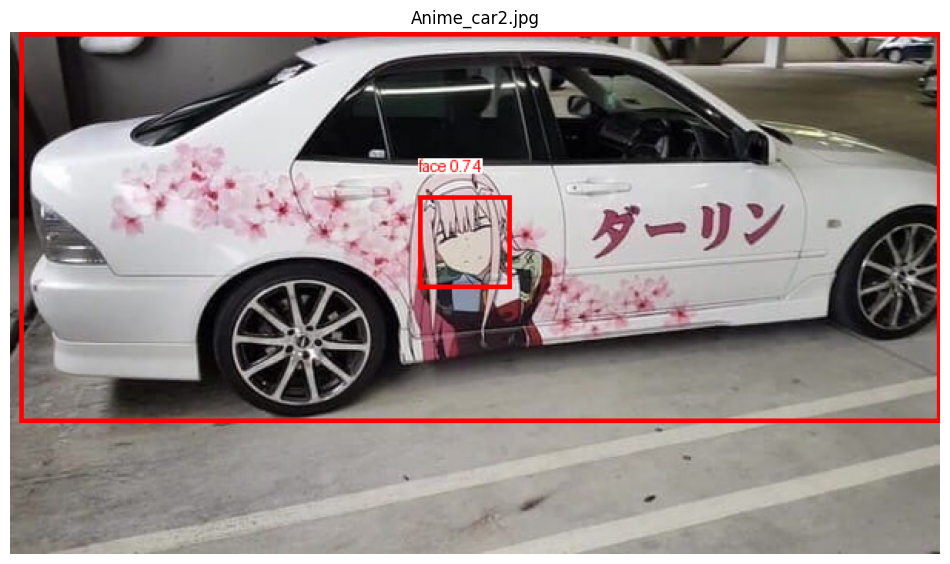


image 1/1 /content/drive/MyDrive/data_set_face/test/Anime_car.jpg: 384x640 1 car, 20.8ms
Speed: 11.1ms preprocess, 20.8ms inference, 6.4ms postprocess per image at shape (1, 3, 384, 640)

Обработка изображения: Anime_car.jpg
Ошибка загрузки шрифта: unknown file format
Обнаружен объект: car, уверенность: 0.32, координаты: [0.0, 0.0, 1177.55126953125, 720.0]


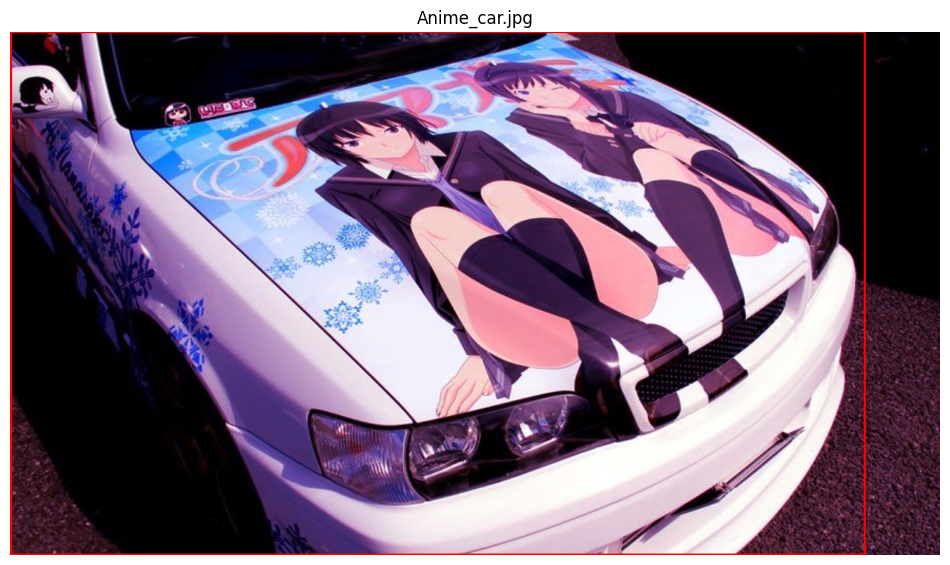


image 1/1 /content/drive/MyDrive/data_set_face/test/Anime_car3.jpg: 384x640 3 faces, 23.8ms
Speed: 11.0ms preprocess, 23.8ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

Обработка изображения: Anime_car3.jpg
Ошибка загрузки шрифта: unknown file format
Обнаружен объект: face, уверенность: 0.74, координаты: [124.092041015625, 113.19715118408203, 195.1039276123047, 184.03196716308594]
Обнаружен объект: face, уверенность: 0.70, координаты: [367.7254333496094, 117.77301788330078, 419.78155517578125, 171.26182556152344]
Обнаружен объект: face, уверенность: 0.62, координаты: [261.865478515625, 160.99148559570312, 313.7641296386719, 214.24688720703125]


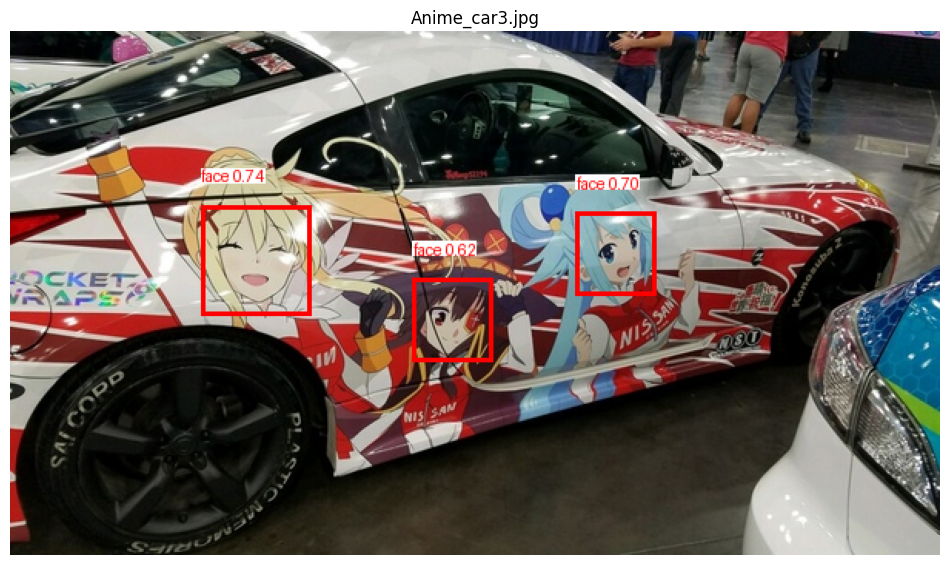


image 1/1 /content/drive/MyDrive/data_set_face/test/Anime_face1.jpg: 640x512 1 face, 21.7ms
Speed: 4.2ms preprocess, 21.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 512)

Обработка изображения: Anime_face1.jpg
Ошибка загрузки шрифта: unknown file format
Обнаружен объект: face, уверенность: 0.78, координаты: [220.9510040283203, 152.14796447753906, 380.7455139160156, 305.05975341796875]


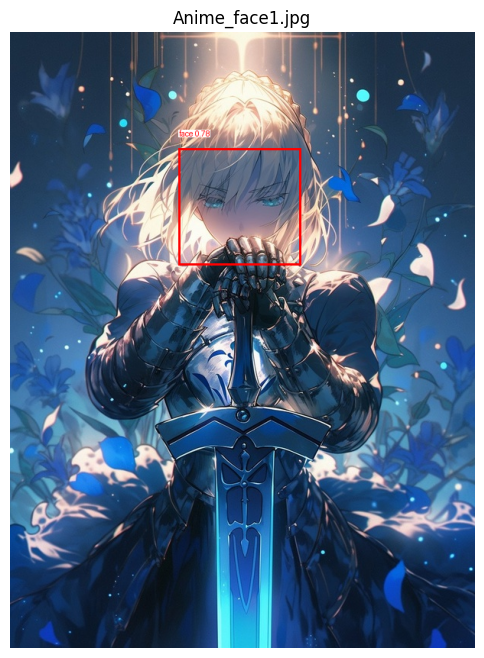


image 1/1 /content/drive/MyDrive/data_set_face/test/Anime_face.jpg: 480x640 1 face, 59.0ms
Speed: 4.2ms preprocess, 59.0ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)

Обработка изображения: Anime_face.jpg
Ошибка загрузки шрифта: unknown file format
Обнаружен объект: face, уверенность: 0.84, координаты: [486.5660095214844, 249.19273376464844, 807.4126586914062, 587.687744140625]


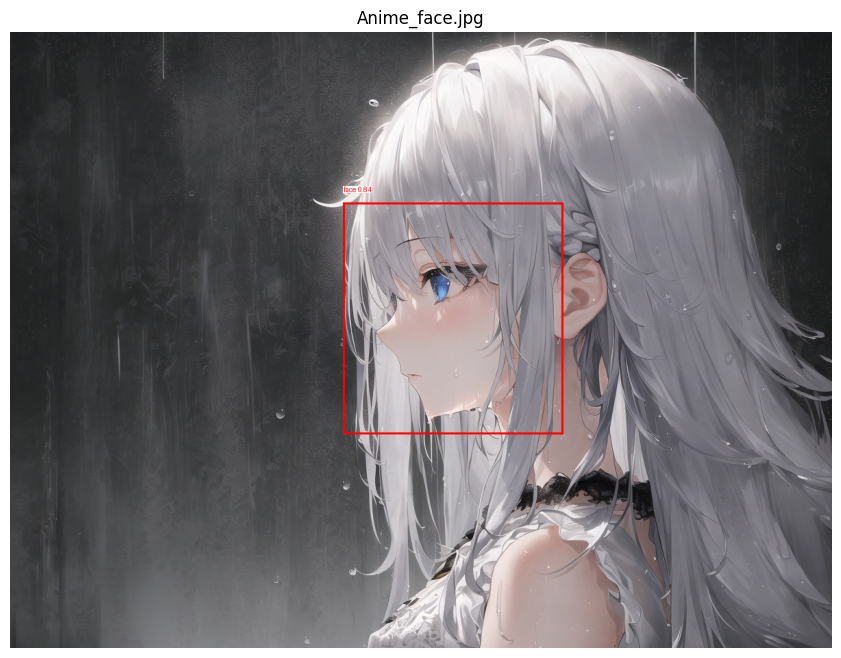


image 1/1 /content/drive/MyDrive/data_set_face/test/Gena.jpg: 416x640 1 face, 178.4ms
Speed: 6.2ms preprocess, 178.4ms inference, 8.1ms postprocess per image at shape (1, 3, 416, 640)

Обработка изображения: Gena.jpg
Ошибка загрузки шрифта: unknown file format
Обнаружен объект: face, уверенность: 0.86, координаты: [766.9137573242188, 271.734130859375, 984.7787475585938, 487.3427734375]


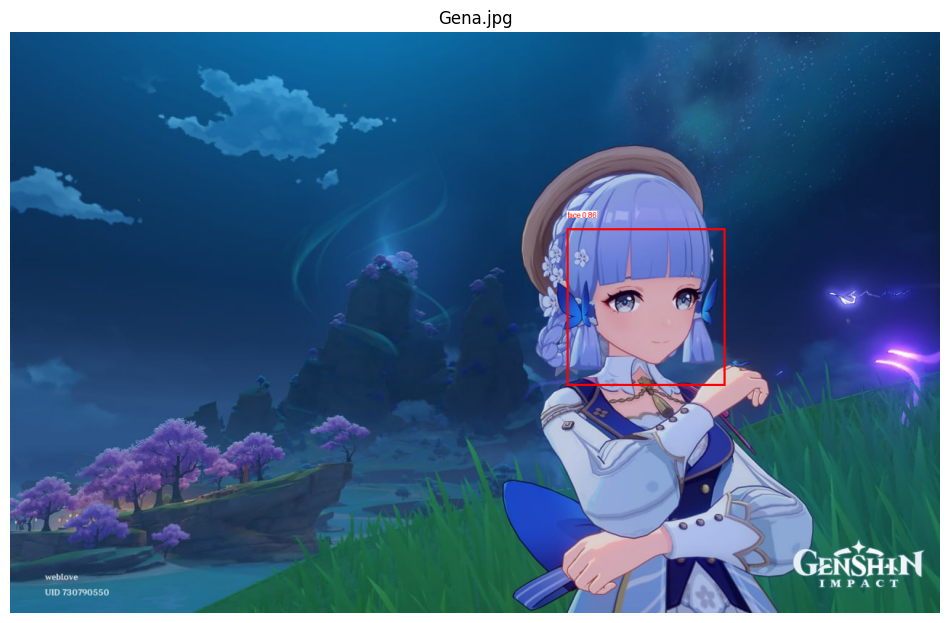

In [ ]:
#@title Тест модели на файлах с гугл диска (вариант модели v2)

import os
from google.colab import drive
from PIL import Image, ImageDraw, ImageFont
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt


import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding


!wget https://github.com/HackFonts/TimesNewRoman/raw/master/Times%20New%20Roman.ttf -O TimesNewRoman.ttf

# 1. Подключение Google Drive
drive.mount('/content/drive')

# 3. Путь к папке с тестовыми изображениями на Google Drive
test_images_dir =  '/content/drive/MyDrive/data_set_face/test'   # **Укажите путь к папке с тестовыми изображениями!**

# 4. Получение списка файлов изображений
image_files = [f for f in os.listdir(test_images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# 5. Параметры отображения

# 2. Настройки шрифта
FONT_PATH = "/content/TimesNewRoman.ttf"
FONT_SIZE = 20  # Можно регулировать размер

BOX_COLOR = "red"
BOX_WIDTH = 3
TEXT_COLOR = "red"
TEXT_BG_COLOR = "white"  # Цвет фона текста

# 6. Функция для создания подписи
def draw_label(draw, position, text, font):
    # Рассчитываем размеры текста
    bbox = draw.textbbox(position, text, font=font)

    # Рисуем фон
    draw.rectangle(bbox, fill=TEXT_BG_COLOR)

    # Рисуем текст
    draw.text(position, text, fill=TEXT_COLOR, font=font)

# 7. Обработка изображений
for image_file in image_files:
    image_path = os.path.join(test_images_dir, image_file)
    results = model.predict(image_path)

    print(f"\nОбработка изображения: {image_file}")

    for result in results:
        img = Image.open(image_path).convert("RGB")
        draw = ImageDraw.Draw(img)

        try:
            font = ImageFont.truetype(FONT_PATH, FONT_SIZE)
        except Exception as e:
            print(f"Ошибка загрузки шрифта: {str(e)}")
            font = ImageFont.load_default()

        for box in result.boxes:
            xyxy = box.xyxy[0].tolist()
            conf = box.conf[0].item()
            cls = int(box.cls[0].item())

            # Вывод информации в консоль
            print(f"Обнаружен объект: {model.names[cls]}, уверенность: {conf:.2f}, координаты: {xyxy}")

            # Рисуем bounding box
            x1, y1, x2, y2 = xyxy
            draw.rectangle(((x1, y1), (x2, y2)), outline=BOX_COLOR, width=BOX_WIDTH)

            # Формируем текст
            label = f'{model.names[cls]} {conf:.2f}'

            # Позиция текста (над bounding box)
            text_position = (x1, y1 - FONT_SIZE - 5)

            # Рисуем текст с фоном
            draw_label(draw, text_position, label, font)

        # Отображение
        plt.figure(figsize=(12, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.title(image_file)
        plt.show()

ДАЛЕЕ ИДЁТ ВЕРСИЯ МОДЕЛИ V2, НО ОБУЧЕННАЯ МОДЕЛЬ ПОДГРУЖАЕТСЯ С GITHAB  (ОБУЧЕНИЕ БЫЛО ВПРОШЛОМ АБЗАЦЕ)

In [4]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 50.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 79.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 60.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 44.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 63.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

Cloning into 'CV_LB4'...
remote: Enumerating objects: 93, done.
remote: Counting objects: 100% (93/93), done.
remote: Compressing objects: 100% (89/89), done.
remote: Total 93 (delta 35), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (93/93), 14.88 MiB | 12.39 MiB/s, done.
Resolving deltas: 100% (35/35), done.

image 1/1 /content/CV_LB4/Images_test/Test_car2.jpg: 384x640 1 car, 8.6ms
Speed: 3.2ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

Обработка изображения: Test_car2.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: car, уверенность: 0.94, координаты: [315.04229736328125, 200.01487731933594, 1557.8807373046875, 865.7401123046875]


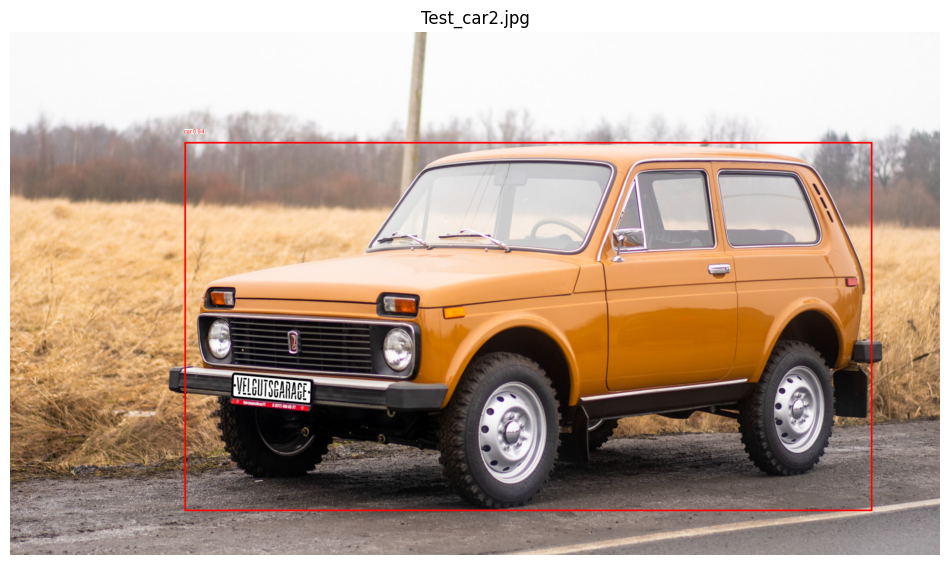


image 1/1 /content/CV_LB4/Images_test/Car_test.jpg: 256x640 1 face, 13.7ms
Speed: 2.6ms preprocess, 13.7ms inference, 1.9ms postprocess per image at shape (1, 3, 256, 640)

Обработка изображения: Car_test.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: face, уверенность: 0.85, координаты: [837.66064453125, 112.38642883300781, 1072.681640625, 349.3402404785156]


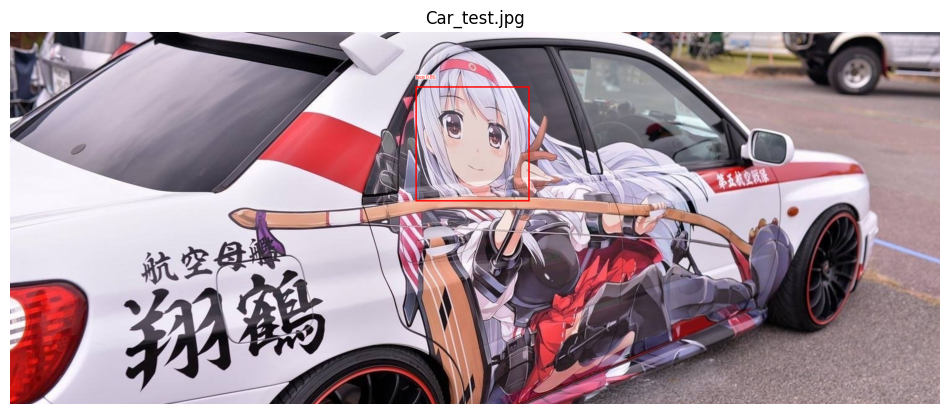


image 1/1 /content/CV_LB4/Images_test/Test_car.jpg: 416x640 1 car, 11.3ms
Speed: 3.0ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 416, 640)

Обработка изображения: Test_car.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: car, уверенность: 0.92, координаты: [165.97265625, 172.4241485595703, 1132.450927734375, 650.2437133789062]


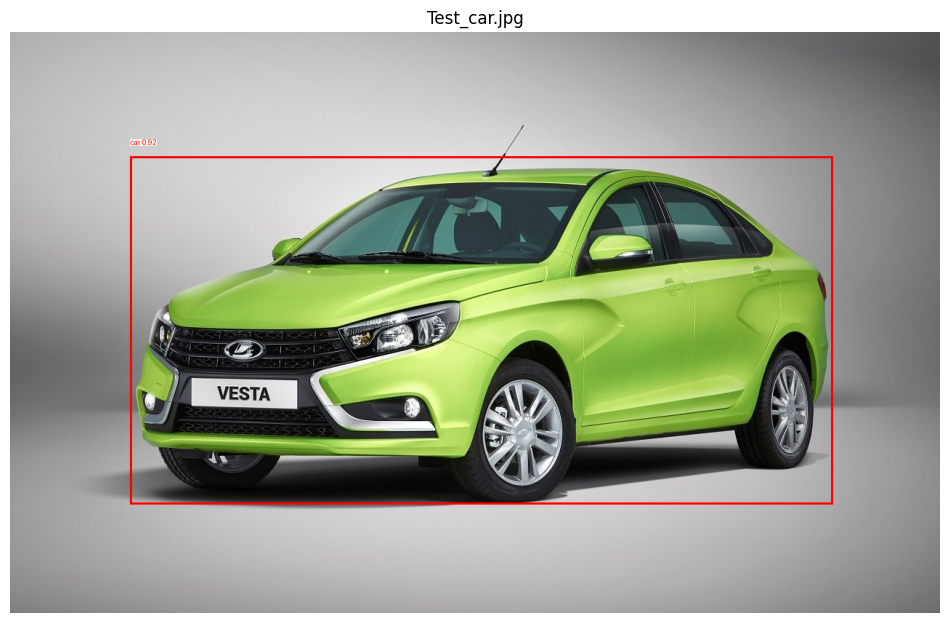


image 1/1 /content/CV_LB4/Images_test/Anime_face.jpg: 480x640 1 face, 11.3ms
Speed: 4.1ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

Обработка изображения: Anime_face.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: face, уверенность: 0.84, координаты: [486.5660095214844, 249.19273376464844, 807.4126586914062, 587.687744140625]


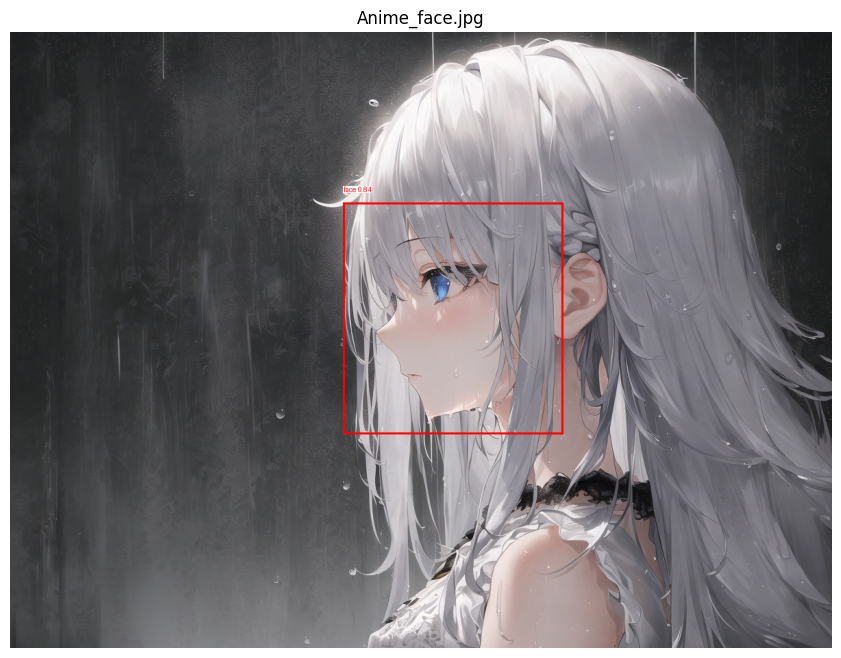


image 1/1 /content/CV_LB4/Images_test/Anime_car.jpg: 384x640 1 car, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

Обработка изображения: Anime_car.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: car, уверенность: 0.32, координаты: [0.0, 0.0, 1177.55126953125, 720.0]


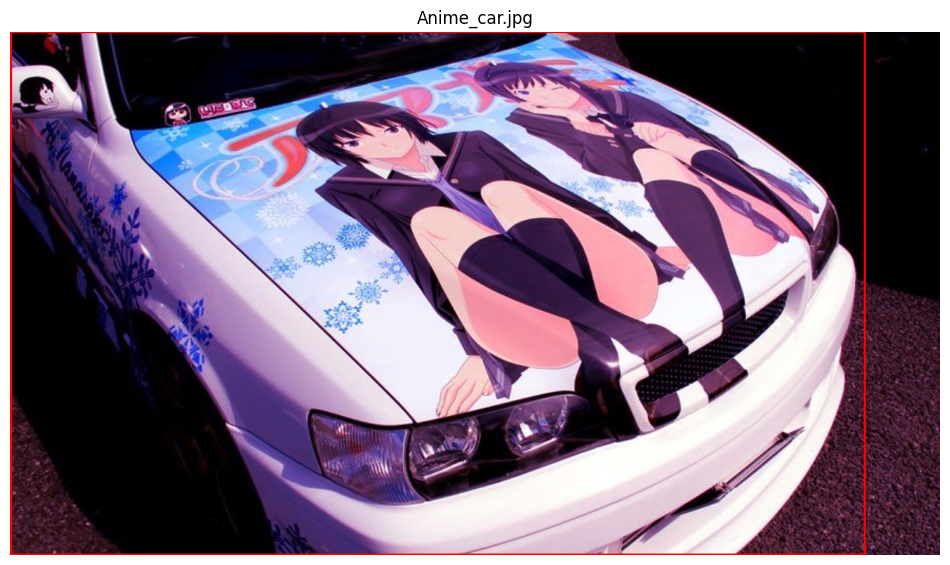


image 1/1 /content/CV_LB4/Images_test/Berserk_test.jpg: 320x640 1 face, 10.6ms
Speed: 3.0ms preprocess, 10.6ms inference, 2.6ms postprocess per image at shape (1, 3, 320, 640)

Обработка изображения: Berserk_test.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: face, уверенность: 0.71, координаты: [148.43560791015625, 2.284097671508789, 453.3024597167969, 288.0714416503906]


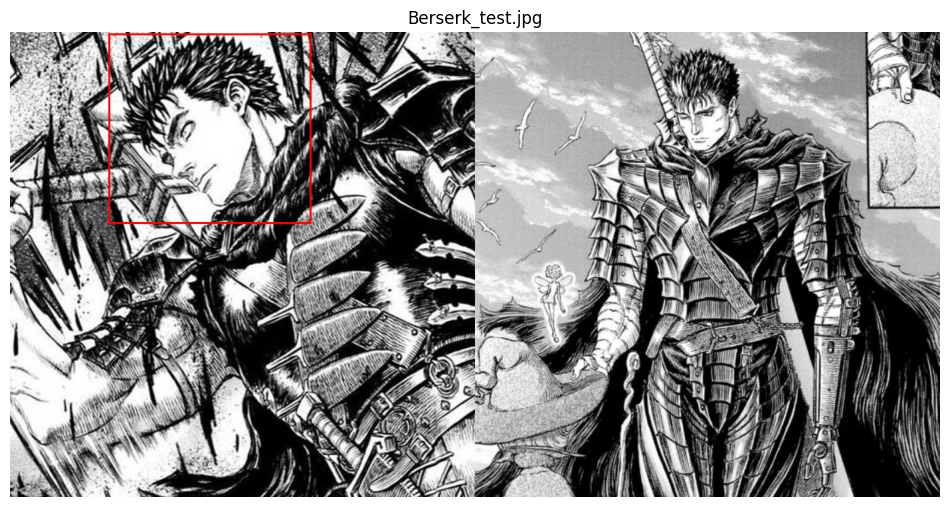


image 1/1 /content/CV_LB4/Images_test/Anime_car3.jpg: 384x640 3 faces, 12.5ms
Speed: 2.9ms preprocess, 12.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

Обработка изображения: Anime_car3.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: face, уверенность: 0.74, координаты: [124.092041015625, 113.19715118408203, 195.1039276123047, 184.03196716308594]
Обнаружен объект: face, уверенность: 0.70, координаты: [367.7254333496094, 117.77301788330078, 419.78155517578125, 171.26182556152344]
Обнаружен объект: face, уверенность: 0.62, координаты: [261.865478515625, 160.99148559570312, 313.7641296386719, 214.24688720703125]


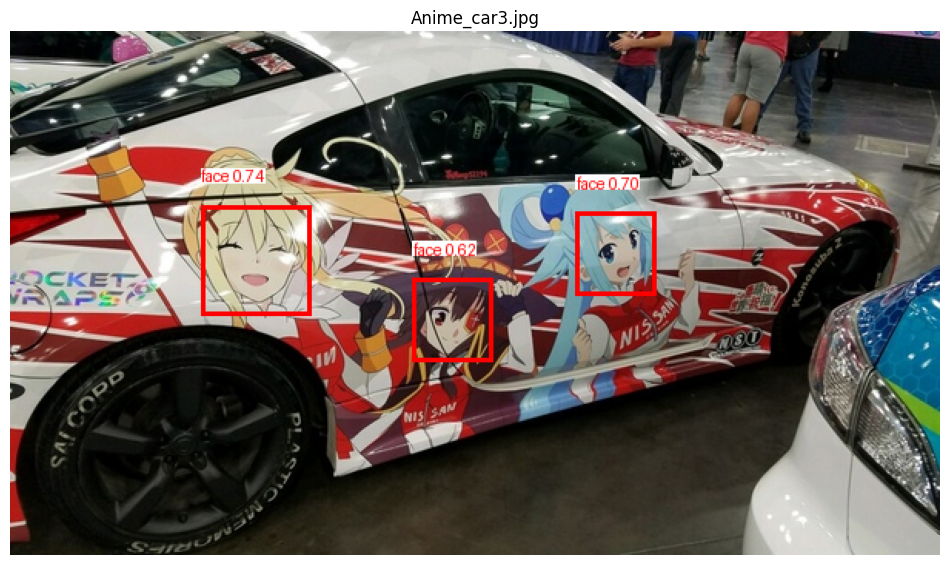


image 1/1 /content/CV_LB4/Images_test/Anime_car4.jpg: 448x640 2 faces, 18.1ms
Speed: 3.2ms preprocess, 18.1ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)

Обработка изображения: Anime_car4.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: face, уверенность: 0.75, координаты: [332.974365234375, 135.72525024414062, 400.08935546875, 200.20533752441406]
Обнаружен объект: face, уверенность: 0.63, координаты: [39.32880783081055, 249.34304809570312, 174.54281616210938, 381.6183166503906]


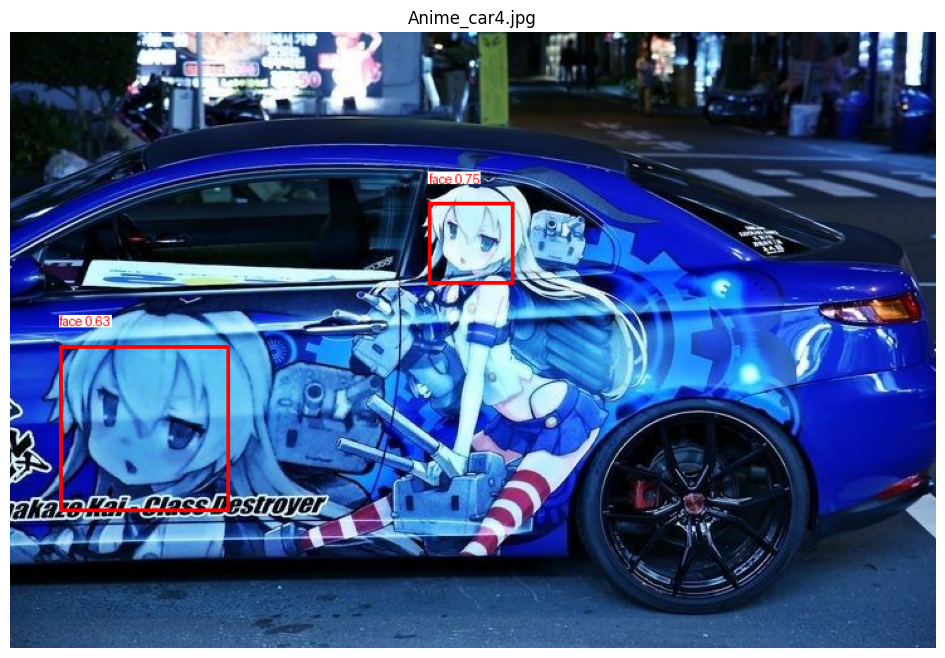


image 1/1 /content/CV_LB4/Images_test/Anime_face1.jpg: 640x512 1 face, 17.0ms
Speed: 3.7ms preprocess, 17.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 512)

Обработка изображения: Anime_face1.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: face, уверенность: 0.78, координаты: [220.9510040283203, 152.14796447753906, 380.7455139160156, 305.05975341796875]


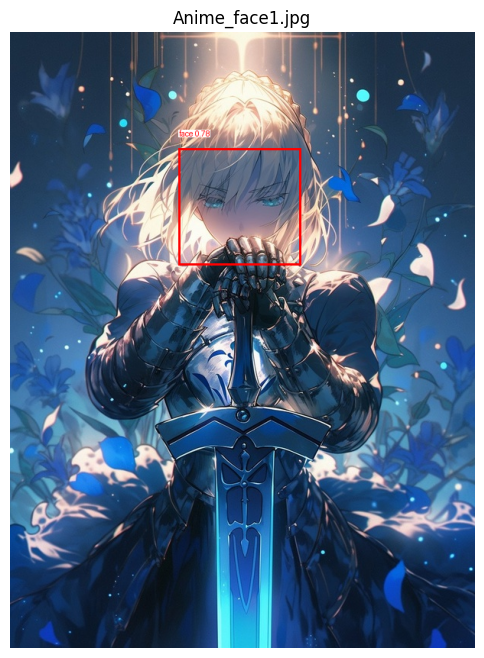


image 1/1 /content/CV_LB4/Images_test/Anime_car2.jpg: 384x640 1 face, 1 car, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

Обработка изображения: Anime_car2.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: car, уверенность: 0.89, координаты: [6.829630374908447, 0.0, 604.0, 253.9812774658203]
Обнаружен объект: face, уверенность: 0.74, координаты: [265.072509765625, 106.09134674072266, 325.4231872558594, 166.35040283203125]


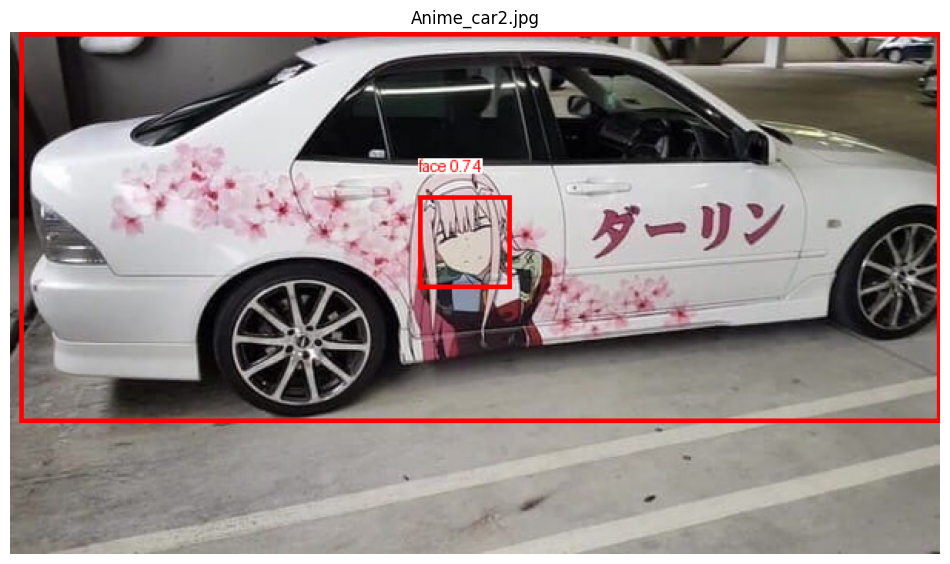


image 1/1 /content/CV_LB4/Images_test/Car_dgiga.jpg: 480x640 1 car, 10.3ms
Speed: 3.2ms preprocess, 10.3ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)

Обработка изображения: Car_dgiga.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: car, уверенность: 0.86, координаты: [209.70333862304688, 387.1651611328125, 1139.6083984375, 856.462646484375]


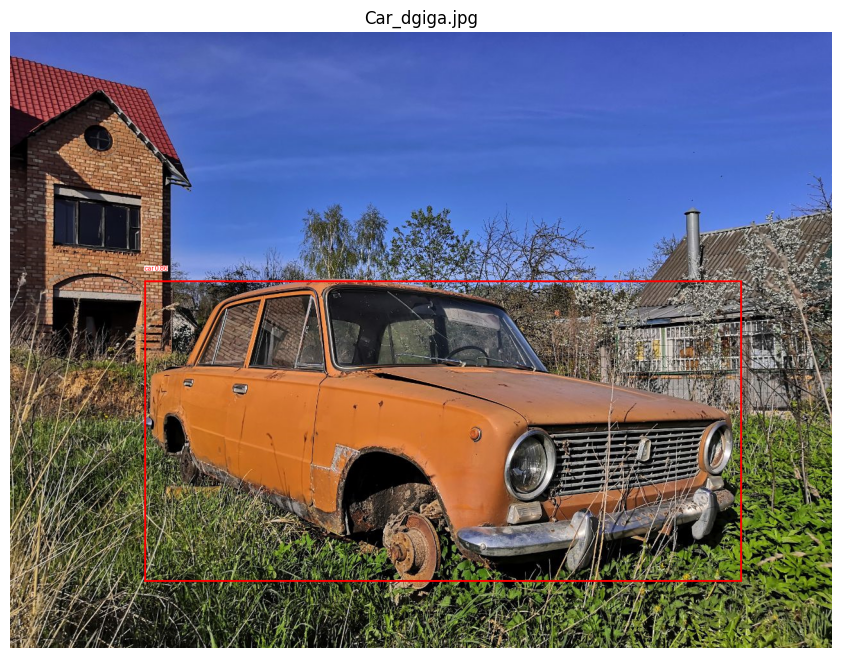


image 1/1 /content/CV_LB4/Images_test/Aska_test.jpg: 512x640 1 face, 14.7ms
Speed: 8.0ms preprocess, 14.7ms inference, 1.6ms postprocess per image at shape (1, 3, 512, 640)

Обработка изображения: Aska_test.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: face, уверенность: 0.86, координаты: [302.77313232421875, 130.84474182128906, 559.064208984375, 390.546142578125]


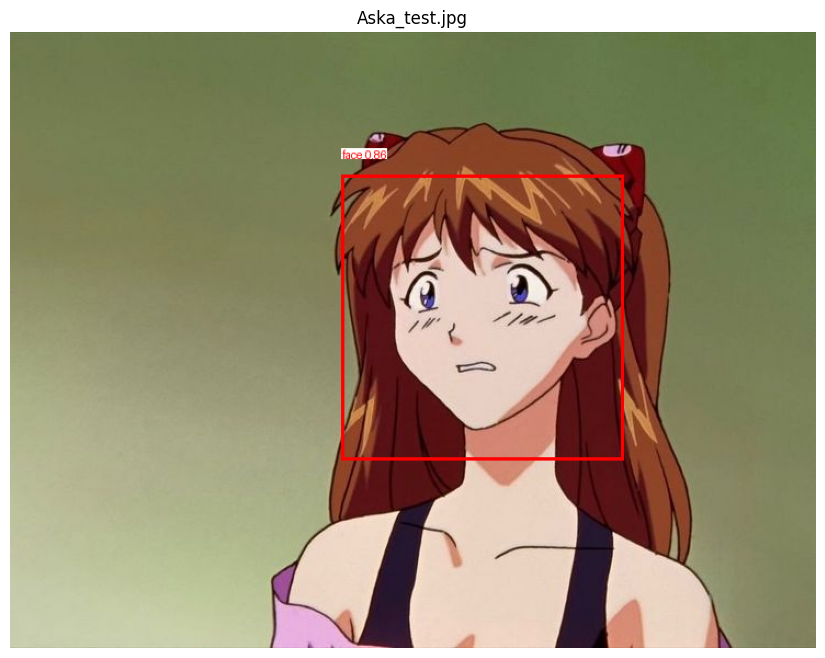


image 1/1 /content/CV_LB4/Images_test/Anime_car5.jpg: 448x640 1 face, 1 car, 14.4ms
Speed: 6.8ms preprocess, 14.4ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)

Обработка изображения: Anime_car5.jpg
Ошибка загрузки шрифта: cannot open resource
Обнаружен объект: car, уверенность: 0.84, координаты: [42.52464294433594, 0.0, 697.0294799804688, 488.30889892578125]
Обнаружен объект: face, уверенность: 0.64, координаты: [502.36871337890625, 180.90631103515625, 587.3396606445312, 265.1802062988281]


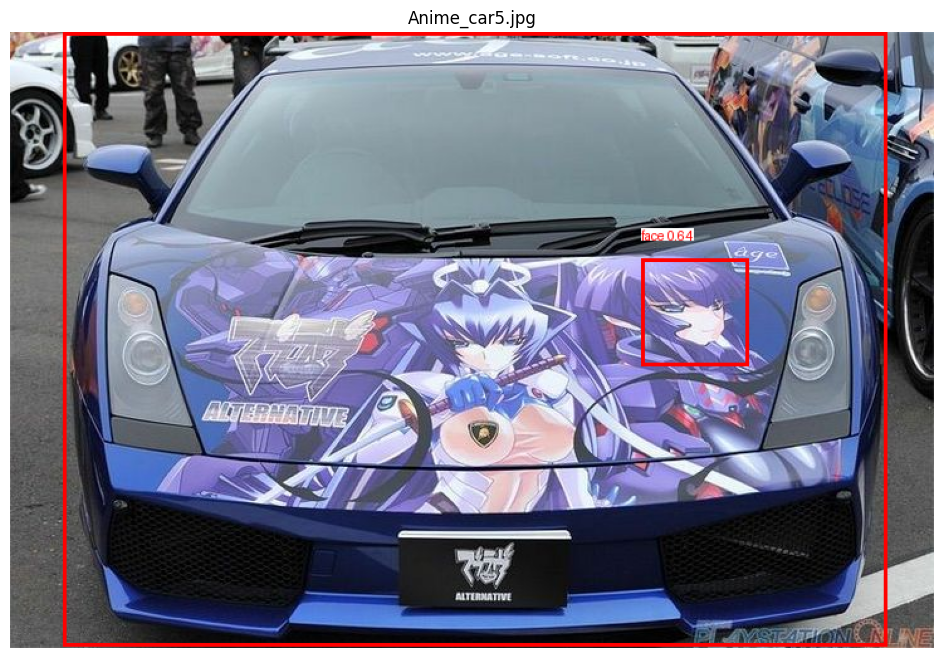

In [43]:
#@title Подгруза и тест модели с GITHAB с изображениями на нём же (вариант модели v2)

import locale
import os
from google.colab import drive
from PIL import Image, ImageDraw, ImageFont
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt

# Устанавливаем локаль UTF-8
locale.getpreferredencoding = lambda: "UTF-8"

!git clone https://github.com/GreyPaldin/CV_LB4.git

model = YOLO("/content/CV_LB4/Car_face.pt")
data_yaml = '/content/data.yaml'

# 3. Путь к папке с тестовыми изображениями на GITHAB
test_images_dir =  '/content/CV_LB4/Images_test'   # **Укажите путь к папке с тестовыми изображениями!**

# 4. Получение списка файлов изображений
image_files = [f for f in os.listdir(test_images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]

# 5. Параметры отображения

# 2. Настройки шрифта
FONT_PATH = "/content/TimesNewRoman.ttf"
FONT_SIZE = 20  # Можно регулировать размер

BOX_COLOR = "red"
BOX_WIDTH = 3
TEXT_COLOR = "red"
TEXT_BG_COLOR = "white"  # Цвет фона текста

# 6. Функция для создания подписи
def draw_label(draw, position, text, font):
    # Рассчитываем размеры текста
    bbox = draw.textbbox(position, text, font=font)

    # Рисуем фон
    draw.rectangle(bbox, fill=TEXT_BG_COLOR)

    # Рисуем текст
    draw.text(position, text, fill=TEXT_COLOR, font=font)

# 7. Обработка изображений
for image_file in image_files:
    image_path = os.path.join(test_images_dir, image_file)
    results = model.predict(image_path)

    print(f"\nОбработка изображения: {image_file}")

    for result in results:
        img = Image.open(image_path).convert("RGB")
        draw = ImageDraw.Draw(img)

        try:
            font = ImageFont.truetype(FONT_PATH, FONT_SIZE)
        except Exception as e:
            print(f"Ошибка загрузки шрифта: {str(e)}")
            font = ImageFont.load_default()

        for box in result.boxes:
            xyxy = box.xyxy[0].tolist()
            conf = box.conf[0].item()
            cls = int(box.cls[0].item())

            # Вывод информации в консоль
            print(f"Обнаружен объект: {model.names[cls]}, уверенность: {conf:.2f}, координаты: {xyxy}")

            # Рисуем bounding box
            x1, y1, x2, y2 = xyxy
            draw.rectangle(((x1, y1), (x2, y2)), outline=BOX_COLOR, width=BOX_WIDTH)

            # Формируем текст
            label = f'{model.names[cls]} {conf:.2f}'

            # Позиция текста (над bounding box)
            text_position = (x1, y1 - FONT_SIZE - 5)

            # Рисуем текст с фоном
            draw_label(draw, text_position, label, font)

        # Отображение
        plt.figure(figsize=(12, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.title(image_file)
        plt.show()

In [ ]:
ОЦЕНКА МЕТРИК

In [ ]:
# 3. Оценка модели на валидационном наборе
metrics = model.val(data=data_yaml,
                   split='val',  # Используем валидационный набор
                   plots=True)    # Генерация графиков


Основные метрики модели:
mAP@0.5: 0.9841
mAP@0.5:0.95: 0.8428
Precision: 0.9913
Recall: 0.9630
F1-score: 0.9768

Метрики по классам:

Класс 'face':
  Precision: 0.9833
  Recall: 0.9276
  F1-score: 0.9547
  AP@0.5: 0.9733

Класс 'car':
  Precision: 0.9994
  Recall: 0.9983
  F1-score: 0.9989
  AP@0.5: 0.9950


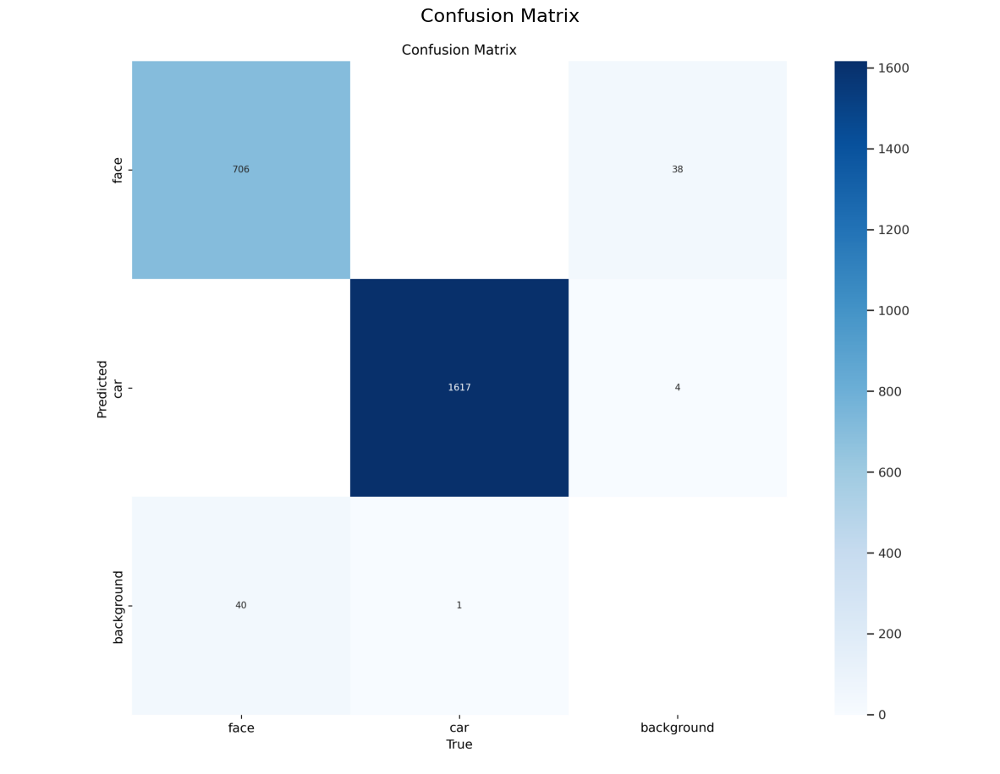

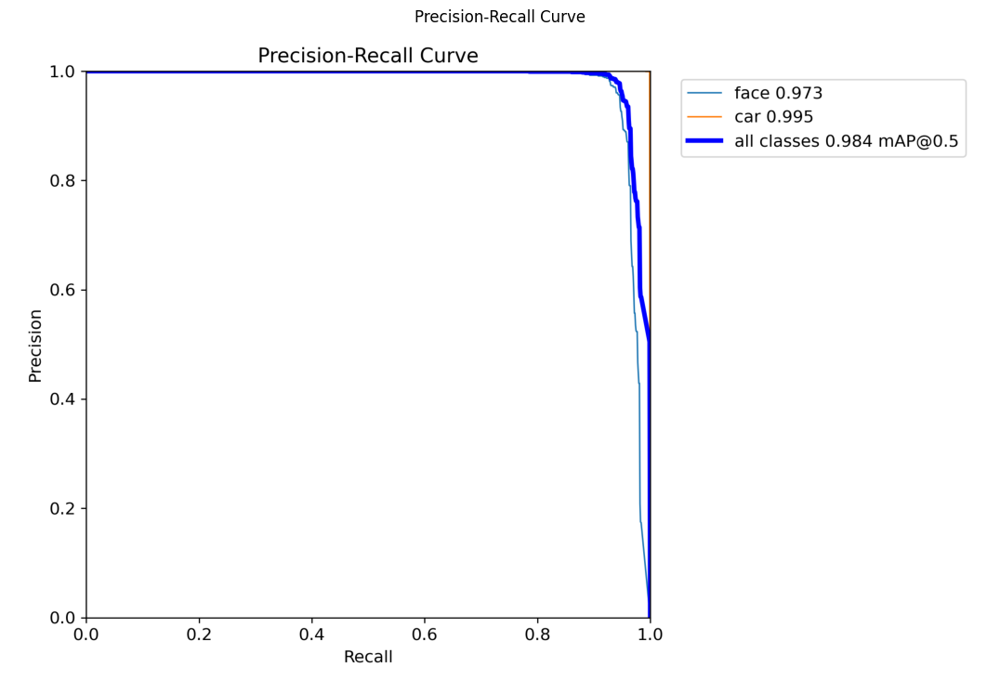

In [40]:
# 4. Вывод основных метрик (исправленная версия)
print("\nОсновные метрики модели:")
print(f"mAP@0.5: {metrics.box.map50:.4f}")  # Средний AP при IoU=0.5
print(f"mAP@0.5:0.95: {metrics.box.map:.4f}")  # Средний AP при IoU=0.5-0.95
print(f"Precision: {metrics.box.mp:.4f}")  # Средняя точность по всем классам
print(f"Recall: {metrics.box.mr:.4f}")  # Средняя полнота по всем классам

# Вычисляем средний F1-score по всем классам
mean_f1 = metrics.box.f1.mean() if hasattr(metrics.box.f1, 'mean') else (2 * metrics.box.mp * metrics.box.mr) / (metrics.box.mp + metrics.box.mr)
print(f"F1-score: {mean_f1:.4f}")

# 5. Вывод метрик по классам
print("\nМетрики по классам:")
for i, class_name in enumerate(data['names']):
    print(f"\nКласс '{class_name}':")
    print(f"  Precision: {metrics.box.p[i]:.4f}")
    print(f"  Recall: {metrics.box.r[i]:.4f}")
    print(f"  F1-score: {metrics.box.f1[i]:.4f}")
    print(f"  AP@0.5: {metrics.box.ap50[i]:.4f}")

# 6. Визуализация кривых Precision-Recall
results_dir = metrics.save_dir

# 1. Загружаем стандартную матрицу
conf_matrix = plt.imread(os.path.join(results_dir, 'confusion_matrix.png'))

# 2. Создаем увеличенную версию
plt.figure(figsize=(15, 12))
plt.imshow(conf_matrix)
plt.title('Confusion Matrix', fontsize=16)
plt.axis('off')

plt.show()
try:
    plt.figure(figsize=(30, 12))

    # Precision-Recall Curve
    plt.subplot(1, 2, 1)
    pr_curve = plt.imread(os.path.join(results_dir, 'PR_curve.png'))
    plt.imshow(pr_curve)
    plt.title('Precision-Recall Curve')
    plt.axis('off')


    plt.show()
except FileNotFoundError as e:
    print(f"\nНе удалось загрузить графики: {e}")

ДЛЯ ЧИСТКИ ФАЙЛОВ

In [30]:
import os
import shutil

# Получаем список всех файлов и папок в текущей директории
files = os.listdir('/content/')

# Проходим по списку и удаляем каждый файл и папку
for f in files:
    file_path = os.path.join('/content/', f)
    try:
        if os.path.isfile(file_path) or os.path.islink(file_path):
            os.unlink(file_path)
        elif os.path.isdir(file_path):
            shutil.rmtree(file_path)
    except Exception as e:
        print(f"Не удалось удалить {file_path}. Причина: {e}")

print("Все файлы и папки в /content/ удалены.")

Не удалось удалить /content/drive. Причина: [Errno 125] Operation canceled: '.file-revisions-by-id'
Все файлы и папки в /content/ удалены.
